In [1]:
import os
import numpy as np
import pandas as pd

DATA_PATH = '../data/'

def get_tois(
    clobber=False,
    outdir=DATA_PATH,
    verbose=False,
    remove_FP=True,
    remove_known_planets=False,
    add_FPP=False,
):
    """Download TOI list from TESS Alert/TOI Release.

    Parameters
    ----------
    clobber : bool
        re-download table and save as csv file
    outdir : str
        download directory location
    verbose : bool
        print texts

    Returns
    -------
    d : pandas.DataFrame
        TOI table as dataframe
    """
    dl_link = "https://exofop.ipac.caltech.edu/tess/download_toi.php?sort=toi&output=csv"
    fp = os.path.join(outdir, "TOIs.csv")
    if not os.path.exists(outdir):
        os.makedirs(outdir)

    if not os.path.exists(fp) or clobber:
        d = pd.read_csv(dl_link)  # , dtype={'RA': float, 'Dec': float})
        msg = f"Downloading {dl_link}\n"
        if add_FPP:
            fp2 = os.path.join(outdir, "Giacalone2020/tab4.txt")
            classified = ascii.read(fp2).to_pandas()
            fp3 = os.path.join(outdir, "Giacalone2020/tab5.txt")
            unclassified = ascii.read(fp3).to_pandas()
            fpp = pd.concat(
                [
                    classified[["TOI", "FPP-2m", "FPP-30m"]],
                    unclassified[["TOI", "FPP"]],
                ],
                sort=True,
            )
            d = pd.merge(d, fpp, how="outer").drop_duplicates()
        d.to_csv(fp, index=False)
    else:
        d = pd.read_csv(fp).drop_duplicates()
        msg = f"Loaded: {fp}\n"
    assert len(d) > 1000, f"{fp} likely has been overwritten!"

    # remove False Positives
    if remove_FP:
        d = d[d["TFOPWG Disposition"] != "FP"]
        msg += "TOIs with TFPWG disposition==FP are removed.\n"
    if remove_known_planets:
        planet_keys = [
            "HD",
            "GJ",
            "LHS",
            "XO",
            "Pi Men" "WASP",
            "SWASP",
            "HAT",
            "HATS",
            "KELT",
            "TrES",
            "QATAR",
            "CoRoT",
            "K2",  # , "EPIC"
            "Kepler",  # "KOI"
        ]
        keys = []
        for key in planet_keys:
            idx = ~np.array(
                d["Comments"].str.contains(key).tolist(), dtype=bool
            )
            d = d[idx]
            if idx.sum() > 0:
                keys.append(key)
        msg += f"{keys} planets are removed.\n"
    msg += f"Saved: {fp}\n"
    if verbose:
        print(msg)
    return d.sort_values("TOI")

In [2]:
tois = get_tois(clobber=False)
tois.tail()

,TIC ID,TOI,Previous CTOI,Master,SG1A,SG1B,SG2,SG3,SG4,SG5,...,Stellar Radius (R_Sun) err,Stellar Metallicity,Stellar Metallicity err,Stellar Mass (M_Sun),Stellar Mass (M_Sun) err,Sectors,Date TOI Alerted (UTC),Date TOI Updated (UTC),Date Modified,Comments
5840,310380289,5736.01,NaN,2,4,2,2,1,4,4,...,0.017258,NaN,NaN,0.571061,0.020310,"16,49,50",2022-08-18,2022-08-18,2022-08-19 12:55:35,very low SNR; v-shaped
5841,229618478,5737.01,NaN,2,4,2,2,1,4,4,...,0.018153,NaN,NaN,0.602748,0.020159,"14,17,18,19,21,22,23,24,25,26,40,47,48,50",2022-08-18,2022-08-18,2022-08-19 12:55:35,low SNR
5842,198162530,5738.01,NaN,2,4,2,2,1,4,4,...,0.016852,NaN,NaN,0.562819,0.020236,"14,15,16,17,18,19,21,22,23,24,25,47,48,49,50",2022-08-18,2022-08-18,2022-08-19 12:55:35,possible SV; bump before transits; inconsisten...
5843,328934980,5739.01,NaN,2,4,2,2,1,4,4,...,0.056105,NaN,NaN,1.150000,0.155358,"23,50",2022-08-18,2022-08-18,2022-08-19 12:55:35,period may be double (16.86 d)
5844,230087765,5740.01,NaN,2,4,2,2,1,4,4,...,0.063731,NaN,NaN,0.718000,0.085366,"14,15,16,17,18,19,20,21,22,23,24,25,26,41,47,4...",2022-08-18,2022-08-18,2022-08-19 12:55:35,very low SNR; centroid offset scattered across...


In [3]:
tois = get_tois(clobber=False)
drop_cols = ['Previous CTOI', 'Master', 'SG1A', 'SG1B', 'SG2',
            'SG3', 'SG4', 'SG5', 'ACWG ESM', 'ACWG TSM', 'Time Series Observations',
            'Spectroscopy Observations', 'Imaging Observations', 'TESS Disposition',
            'TFOPWG Disposition', 'Date TOI Updated (UTC)', 'Date Modified', 'Comments',
            'Planet Name', 'Pipeline Signal ID', 'Source', 'Detection', 'Epoch (BJD)'
            'Sectors', 'Date TOI Alerted (UTC)'
            ]
tois = tois.drop(drop_cols, axis=1).filter(regex='^((?!err).)*$')
tois.columns.tolist()

['TIC ID',
 'TOI',
 'TESS Mag',
 'RA',
 'Dec',
 'PM RA (mas/yr)',
 'PM Dec (mas/yr)',
 'Epoch (BJD)',
 'Period (days)',
 'Duration (hours)',
 'Depth (mmag)',
 'Depth (ppm)',
 'Planet Radius (R_Earth)',
 'Planet Insolation (Earth Flux)',
 'Planet Equil Temp (K)',
 'Planet SNR',
 'Stellar Distance (pc)',
 'Stellar Eff Temp (K)',
 'Stellar log(g) (cm/s^2)',
 'Stellar Radius (R_Sun)',
 'Stellar Metallicity',
 'Stellar Mass (M_Sun)']

In [8]:
import panel as pn
import hvplot.pandas
# pn.extension(sizing_mode="stretch_width")

# cols = tois.columns.tolist()
tois['log10 Period (days)'] = np.log10(tois['Period (days)'])

x = pn.widgets.Select(name='x', options=cols, value='Period (days)')
y = pn.widgets.Select(name='y', options=cols, value='Planet Radius (R_Earth)')
z = pn.widgets.Select(name='z', options=cols, value='Stellar Radius (R_Sun)')
kind = pn.widgets.Select(name='kind', value='scatter', options=['scatter', 'contour']
                        )

plot = tois.hvplot(x=x, y=y, c=z, kind=kind, 
                   hover_cols=['TIC ID', 'TOI'],
                   logx=True, logy=True, logz=True, 
                   colorbar=False, width=800, height=600, 
                   cmap='RdBu', clim=[]
                  )

page = pn.Column(
    '# TOI plots',
     pn.Row(pn.WidgetBox(x, y, z, kind), plot)
)
# page.save('test.html', embed=True)
page

/home/jp/miniconda3/envs/py3/lib/python3.6/site-packages/pandas/core/series.py:726: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


Column
    [0] Markdown(str)
    [1] Row
        [0] WidgetBox
            [0] Select(name='x', options=['TIC ID', 'TOI', ...], value='Period (days)')
            [1] Select(name='y', options=['TIC ID', 'TOI', ...], value='Planet Radius (R_Earth)')
            [2] Select(name='z', options=['TIC ID', 'TOI', ...], value='Stellar Radius (R_Sun)')
            [3] Select(name='kind', options=['scatter', 'contour'], value='scatter')
        [1] ParamFunction(function)

In [6]:
from pathlib import Path
from pprint import pprint

from astropy.table import Table
from astroquery.vizier import Vizier

VIZIER_KEYS_CLUSTER_CATALOG = {
    # 570 new open clusters in the Galactic disc
    "CastroGinard2020": "J/A+A/635/A45",
    # 1481 clusters and their members
    "CantatGaudin2020": "J/A+A/633/A99",
    # open clusters in the Galactic anticenter
    "CastroGinard2019": "J/A+A/627/A35",
    #
    "CantatGaudin2018": "J/A+A/618/A93",
    # HRD of Gaia DR2
}

CATALOG_LIST = [key for key in VIZIER_KEYS_CLUSTER_CATALOG.keys()]

class CatalogDownloader:
    """download tables from vizier

    Attributes
    ----------
    tables : astroquery.utils.TableList
        collection of astropy.table.Table downloaded from vizier
    """

    def __init__(
        self, catalog_name, data_loc=DATA_PATH, verbose=True, clobber=False
    ):
        self.catalog_name = catalog_name
        self.catalog_dict = VIZIER_KEYS_CLUSTER_CATALOG
        self.verbose = verbose
        self.clobber = clobber
        if not Path(data_loc).exists():
            Path(data_loc).mkdir()
        self.data_loc = Path(data_loc, self.catalog_name)
        self.tables = None

    def get_tables_from_vizier(self, row_limit=50, save=False, clobber=None):
        """row_limit-1 to download all rows"""
        clobber = self.clobber if clobber is None else clobber
        if row_limit == -1:
            msg = "Downloading all tables in "
        else:
            msg = f"Downloading the first {row_limit} rows of each table "
        msg += f"{self.catalog_dict[self.catalog_name]} from vizier."
        if self.verbose:
            print(msg)
        # set row limit
        Vizier.ROW_LIMIT = row_limit

        tables = Vizier.get_catalogs(self.catalog_dict[self.catalog_name])
        errmsg = "No data returned from Vizier."
        assert tables is not None, errmsg
        self.tables = tables

        if self.verbose:
            pprint({k: tables[k]._meta["description"] for k in tables.keys()})

        if save:
            self.save_tables(clobber=clobber)
        return tables

    def save_tables(self, clobber=None):
        errmsg = "No tables to save"
        assert self.tables is not None, errmsg
        clobber = self.clobber if clobber is None else clobber

        if not self.data_loc.exists():
            self.data_loc.mkdir()

        for n, table in enumerate(self.tables):
            fp = Path(self.data_loc, f"{self.catalog_name}_tab{n}.txt")
            if not fp.exists() or clobber:
                table.write(fp, format="ascii")
                if self.verbose:
                    print(f"Saved: {fp}")
            else:
                print("Set clobber=True to overwrite.")

    def get_vizier_url(self, catalog_name=None):
        if catalog_name is None:
            catalog_name = self.catalog_name
        base_url = "https://vizier.u-strasbg.fr/viz-bin/VizieR?-source="
        vizier_key = self.catalog_dict[catalog_name]
        return base_url + vizier_key

    def __repr__(self):
        """Override to print a readable string representation of class
        """
        included_args = ["catalog_name", "cluster_name"]
        args = []
        for key in self.__dict__.keys():
            val = self.__dict__.get(key)
            if key in included_args:
                if val is not None:
                    args.append(f"{key}={val}")
        args = ", ".join(args)
        return f"{type(self).__name__}({args})"
    
class ClusterCatalog(CatalogDownloader):
    def __init__(
        self,
        catalog_name="CantatGaudin2020",
        verbose=True,
        clobber=False,
        data_loc=DATA_PATH,
    ):
        super().__init__(
            catalog_name=catalog_name,
            data_loc=data_loc,
            verbose=verbose,
            clobber=clobber,
        )
        """Initialize the catalog

        Attributes
        ----------
        data_loc : str
            data directory
        all_members: pd.DataFrame
            list of all members in catalog
        all_clusters : pd.DataFrame
            list of all clusters in catalog

        Note:
        setting `all_members` as a method (as opposed to attribute)
        seems not
        """
        self.catalog_list = CATALOG_LIST
        self.all_clusters = None  # self.query_catalog(return_members=False)
        self.all_members = None
        
        if self.data_loc.exists():  # & len(files)<2:
            if self.clobber:
                _ = self.get_tables_from_vizier(
                    row_limit=-1, save=True, clobber=self.clobber
                )
        else:
            _ = self.get_tables_from_vizier(
                row_limit=-1, save=True, clobber=self.clobber
            )

    def query_catalog(self, name=None, return_members=False, **kwargs):
        """Query catalogs

        Parameters
        ----------
        name : str
            catalog name; see `self.catalog_list`
        return_members : bool
            return parameters for all members instead of the default

        Returns
        -------
        df : pandas.DataFrame
            dataframe parameters of the cluster or its individual members
        Note:
        1. See self.vizier_url() for details
        2. Use the following:
        if np.any(df["parallax"] < 0):
            df = df[(df["parallax"] >= 0) | (df["parallax"].isnull())]
            if verbose:
                print("Some parallaxes are negative!")
                print("These are removed for the meantime.")
                print("For proper treatment, see:")
                print("https://arxiv.org/pdf/1804.09366.pdf\n")

        FIXME: self.all_clusters and self.all_members are repeated each if else block
        """
        self.catalog_name = name if name is not None else self.catalog_name
        if self.verbose:
            print(f"Using {self.catalog_name} catalog.")
        if self.catalog_name == "Bouma2019":
            if return_members:
                df_mem = self.get_members_Bouma2019()
                self.all_members = df_mem
                return df_mem
            else:
                df = self.get_clusters_Bouma2019()
                self.all_clusters = df
                return df
        elif self.catalog_name == "CantatGaudin2020":
            if return_members:
                df_mem = self.get_members_CantatGaudin2020()
                self.all_members = df_mem
                return df_mem
            else:
                df = self.get_clusters_CantatGaudin2020()
                self.all_clusters = df
                return df
        elif self.catalog_name == "CastroGinard2020":
            if return_members:
                df_mem = self.get_members_CastroGinard2020()
                self.all_members = df_mem
                return df_mem
            else:
                df = self.get_clusters_CastroGinard2020()
                self.all_clusters = df
                return df
        elif self.catalog_name == "CastroGinard2019":
            if return_members:
                df_mem = self.get_members_CastroGinard2019()
                self.all_members = df_mem
                return df_mem
            else:
                df = self.get_clusters_CastroGinard2019()
                self.all_clusters = df
                return df
        elif self.catalog_name == "CantatGaudin2018":
            if return_members:
                df_mem = self.get_members_CantatGaudin2018()
                self.all_members = df_mem
                return df_mem
            else:
                df = self.get_clusters_CantatGaudin2018()
                self.all_clusters = df
                return df
            
    def get_clusters_CantatGaudin2020(self):
        """Cantat-Gaudin et al. 2020:
        """
        fp = Path(self.data_loc, f"{self.catalog_name}_tab0.txt")
        tab = Table.read(fp, format="ascii")
        df = tab.to_pandas()
        df = _decode_n_drop(df, ["SimbadName", "dmode_01", "dmode-01"])
        df = df.rename(
            columns={
                "RA_ICRS": "raJ2015",
                "DE_ICRS": "decJ2015",
                "_RA.icrs": "ra",
                "_DE.icrs": "dec",
                "Plx": "parallax",
                "dmode": "distance",
                "pmRA": "pmra",
                "pmDE": "pmdec",
                "N": "Nstars",
            }
        )
        return df

    def get_members_CantatGaudin2020(self):
        """Cantat-Gaudin et al. 2020:
        """
        fp = Path(self.data_loc, f"{self.catalog_name}_tab1.txt")
        tab = Table.read(fp, format="ascii")
        df = tab.to_pandas()
        df = df.applymap(
            lambda x: x.decode("ascii") if isinstance(x, bytes) else x
        )
        df = df.rename(
            columns={
                "RA_ICRS": "raJ2015",
                "DE_ICRS": "decJ2015",
                "_RA.icrs": "ra",
                "_DE.icrs": "dec",
                "Source": "source_id",  # 'RV':'radial_velocity',
                "pmRA": "pmra",
                "pmDE": "pmdec",
                "Plx": "parallax",
                "Gmag": "phot_g_mean_mag",
                "BP-RP": "bp_rp",
            }
        )
        return df

    def get_clusters_CantatGaudin2018(self):
        """Cantat-Gaudin et al. 2018:
        http://vizier.u-strasbg.fr/viz-bin/VizieR?-source=J/A+A/618/A93
        """
        fp = Path(self.data_loc, f"{self.catalog_name}_tab0.txt")
        tab = Table.read(fp, format="ascii")
        df = tab.to_pandas()
        df = _decode_n_drop(df, ["SimbadName", "dmode_01", "dmode-01"])
        df = df.rename(
            columns={
                "RAJ2000": "ra",
                "DEJ2000": "dec",
                "dmode": "distance",
                "pmRA": "pmra",
                "pmDE": "pmdec",
                "plx": "parallax",
            }
        )
        return df

    def get_members_CantatGaudin2018(self):
        """Cantat-Gaudin et al. 2018:
        http://vizier.u-strasbg.fr/viz-bin/VizieR?-source=J/A+A/618/A93
        """
        fp = Path(self.data_loc, f"{self.catalog_name}_tab1.txt")
        tab = Table.read(fp, format="ascii")
        df = tab.to_pandas()
        df = df.applymap(
            lambda x: x.decode("ascii") if isinstance(x, bytes) else x
        )
        df = df.rename(
            columns={
                "RA_ICRS": "raJ2015",
                "DE_ICRS": "decJ2015",
                "_RA.icrs": "ra",
                "_DE.icrs": "dec",
                "Source": "source_id",
                "o_Gmag": "phot_g_n_obs",
                "pmRA": "pmra",
                "pmDE": "pmdec",
                "plx": "parallax",
                # 'Gmag': 'phot_g_mean_mag',
                "BP-RP": "bp_rp",
            }
        )
        return df
    
def _decode_n_drop(df, columns):
    """
    columns : list of columns to drop
    """
    # bytes to str
    df = df.applymap(
        lambda x: x.decode("ascii") if isinstance(x, bytes) else x
    )
    # remove columns
    df = df.drop(columns, axis=1)
    return df

In [7]:
c = ClusterCatalog(catalog_name='CantatGaudin2020')
cc = c.query_catalog()

Using CantatGaudin2020 catalog.


In [6]:
import sys
import astropy.units as u
from astropy.coordinates import Angle, Distance

def plot_interactive(
    catalog_name="CantatGaudin2020",
    min_parallax=1.5,
    thin=10,
    width=800,
    height=400,
):
    """show altair plots of TOI and clusters

    Parameters
    ----------
    plx_cut : float
        parallax cut in mas; default=2 mas < 100pc
    thin : integer
        thinning factor to use ony every nth cluster member
    """
    try:
        import altair as alt
    except ModuleNotFoundError:
        print("pip install altair")

    if sys.argv[-1].endswith("json"):
        print("import altair; altair.renderers.enable('notebook')")

    cc = ClusterCatalog(verbose=False)
    df0 = cc.query_catalog(catalog_name=catalog_name, return_members=False)
    df2 = cc.query_catalog(catalog_name=catalog_name, return_members=True)
    idx = df0.parallax >= min_parallax
    df0 = df0.loc[idx]
    df0["distance"] = Distance(parallax=df0["parallax"].values * u.mas).pc
    # plot catalog
    chart0 = (
        alt.Chart(df0)
        .mark_point(color="red")
        .encode(
            x=alt.X(
                "ra:Q",
                axis=alt.Axis(title="RA"),
                scale=alt.Scale(domain=[0, 360]),
            ),
            y=alt.Y(
                "dec:Q",
                axis=alt.Axis(title="Dec"),
                scale=alt.Scale(domain=[-90, 90]),
            ),
            tooltip=[
                "Cluster:N",
                "distance:Q",
                "parallax:Q",
                "pmra:Q",
                "pmdec:Q",
                "Nstars:Q",
            ],
        )
        .properties(width=width, height=height)
        .interactive()
    )

    # get TOI list
    toi = get_tois(verbose=False, clobber=False)
    toi["TIC_ID"] = toi["TIC ID"]
    toi["RA"] = Angle(toi["RA"].values, unit="hourangle").deg
    toi["Dec"] = Angle(toi["Dec"].values, unit="deg").deg
    toi["url"] = toi['TIC ID'].apply(lambda x: f"https://exofop.ipac.caltech.edu/tess/target.php?id={x}")
    # plot TOI
    chart1 = (
        alt.Chart(toi, title="TOI")
        .transform_calculate(
            # FIXME: url below doesn't work in pop-up chart
            url="https://exofop.ipac.caltech.edu/tess/target.php?id="
            + alt.datum.TIC_ID
        )
        .mark_point(color="black")
        .encode(
            x=alt.X(
                "RA:Q",
                axis=alt.Axis(title="RA"),
                scale=alt.Scale(domain=[0, 360]),
            ),
            y=alt.Y(
                "Dec:Q",
                axis=alt.Axis(title="Dec"),
                scale=alt.Scale(domain=[-90, 90]),
            ),
            tooltip=[
                "TOI:Q",
                "TIC ID:Q",
                "url:N",
                "Stellar Distance (pc):Q",
                "PM RA (mas/yr):Q",
                "PM Dec (mas/yr):Q",
            ],
        )
        .properties(width=width, height=height)
        .interactive()
    )

    # plot cluster members
    idx = df2.parallax >= min_parallax
    df2 = df2.loc[idx]
    # skip other members
    if thin<10:
        alt.data_transformers.disable_max_rows()
    df2 = df2.iloc[::thin, :]
    chart2 = (
        alt.Chart(df2)
        .mark_circle()
        .encode(
            x="ra:Q",
            y="dec:Q",
            color="Cluster:N",
            tooltip=[
                "source_id:O",
                "parallax:Q",
                "pmra:Q",
                "pmdec:Q",
                "phot_g_mean_mag:Q",
            ],
        )
        .properties(width=width, height=height)
        .interactive()
    )

    return chart2 + chart1 + chart0

## star cluster catalog

In [8]:
# !pip install altair

     |████████████████████████████████| 812 kB 29.7 MB/s eta 0:00:01
     |████████████████████████████████| 55 kB 6.3 MB/s  eta 0:00:01


In [10]:
# import altair as alt
# alt.renderers.enable('notebook')

chart = plot_interactive(thin=5, 
                         min_parallax=1.5,
                         width=1600,
                         height=800,
                        )
chart

import altair; altair.renderers.enable('notebook')


/tmp/ipykernel_507/2659655252.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df0["distance"] = Distance(parallax=df0["parallax"].values * u.mas).pc


alt.LayerChart(...)

In [11]:
chart.save('toi_cluster_chart.html')

## neptune desert

In [2]:
from uncertainties import ufloat

def upper_boundary(period, method='stripe'):
    if method=='stripe':
        return -0.33*period+1.17
    elif method=='likelihood':
        a=ufloat(0.31,0.12)
        b=ufloat(1.19,0.06)
        return -a*period+b
    
def lower_boundary(period, method='stripe'):
    if method=='stripe':
        return 0.68*period
    elif method=='likelihood':
        a=ufloat(0.67,0.06)
        b=ufloat(0.01,0.04)
        return a*period-b

In [9]:
df = tois.copy()

/home/jerome/miniconda3/envs/py3/lib/python3.8/site-packages/pandas/core/series.py:856: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/jerome/miniconda3/envs/py3/lib/python3.8/site-packages/pandas/core/series.py:856: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


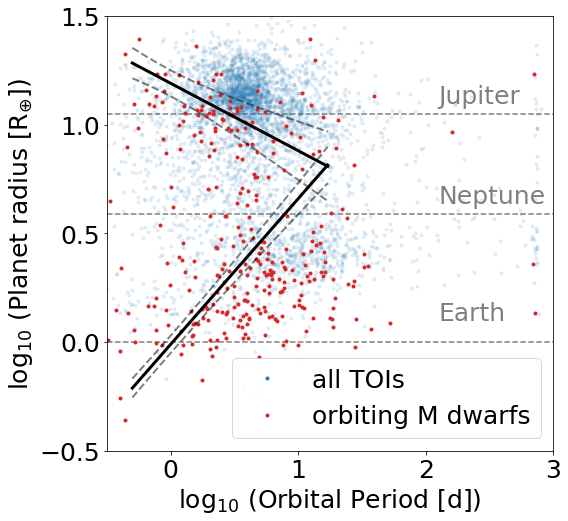

In [14]:
#https://github.com/jpdeleon/toi1696/blob/main/notebooks/neptune_desert.ipynb
import numpy as np
import seaborn as sb
import matplotlib.pyplot as pl
pl.rcParams['font.size'] = 25


fig, ax = pl.subplots(figsize=(8,8))

xmin,xmax=np.log10(0.5), np.log10(17) #day
x=np.linspace(xmin,xmax)

method='likelihood'
y1=[i.n for i in upper_boundary(x,method=method)]
ys1=[i.s for i in upper_boundary(x,method=method)]

y2=[i.n for i in lower_boundary(x,method=method)]
ys2=[i.s for i in lower_boundary(x,method=method)]

xvar, yvar = 'Period (days)', 'Planet Radius (R_Earth)'
idx = df['Stellar Eff Temp (K)']<=3800 #around M dwarfs

ax.plot(np.log10(df.loc[~idx, xvar]), 
        np.log10(df.loc[~idx, yvar]), 
        '.', 
        c='C0',
        label='all TOIs',
        alpha=0.1
       )
ax.plot(np.log10(df.loc[idx, xvar]), 
        np.log10(df.loc[idx, yvar]), 
        '.', 
        c='C3',
        label='orbiting M dwarfs'
       )

leg = pl.legend()
#Disable opacity for legend
for lh in leg.legendHandles: 
    lh._legmarker.set_alpha(1)

#density contour
# _ = sb.kdeplot(np.log10(df[xvar]), 
#                np.log10(df[yvar]), 
#                cmap='gray_r', 
#                n_levels=8, 
#                log_scale=False, 
#                fill=True, 
#                ax=ax, 
#                zorder=-1)

#upper boundary
ax.plot(x,y1,'k-',lw=3,zorder=10)
ax.plot(x,np.add(y1,ys1),'k--',lw=2,zorder=10,alpha=0.5)
ax.plot(x,np.subtract(y1,ys1),'k--',lw=2,zorder=10,alpha=0.5)
#lower boundary
ax.plot(x,y2,'k-',lw=3,zorder=10)
ax.plot(x,np.add(y2,ys2),'k--',lw=2,zorder=10,alpha=0.5)
ax.plot(x,np.subtract(y2,ys2),'k--',lw=2,zorder=10,alpha=0.5)

ax.set_xlabel("$\log_{10}$ (Orbital Period [d])")
ax.set_ylabel("$\log_{10}$ (Planet radius [R$_{\oplus}$])")

alpha = 0.5
ax.axhline(np.log10(1), 0, 1, c='k', ls='--', alpha=alpha, zorder=0)
dx = 2.1
ax.text(dx, 0.1, 'Earth', alpha=alpha)
Rnep = np.log10(3.88)
ax.axhline(Rnep, 0, 1, c='k', ls='--', alpha=alpha, zorder=0)
ax.text(dx, Rnep+0.05, 'Neptune', alpha=alpha)
Rjup = np.log10(11.2)
ax.axhline(Rjup, 0, 1, c='k', ls='--', alpha=alpha, zorder=0)
ax.text(dx, Rjup+0.05, 'Jupiter', alpha=alpha)
ax.set_ylim(-0.5,1.5)
ax.set_xlim(-0.5,3)

ax.locator_params(axis='y', nbins=4)
ax.locator_params(axis='x', nbins=4)